# 1. Importamos librerias

In [31]:
!pip install ydata-profiling
import numpy as np
import pandas as pd
#from pandas.tools.plotting import scatter_matrix
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)
pd.set_option('display.notebook_repr_html', True)
import seaborn as sns
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings('ignore')
import string
import math
import sys
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
import sklearn
from IPython.core.interactiveshell import InteractiveShell
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from ydata_profiling import ProfileReport
from sklearn.linear_model import LinearRegression

InteractiveShell.ast_node_interactivity = "all"



# 2. Generar analisis exploratorio de datos

In [32]:


df = pd.read_csv("student_salary.csv")

profile = ProfileReport(df, title="Reporte de análisis exploratorio", explorative=True)

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 20/20 [00:02<00:00, 10.00it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# 3. Generar tabla de correlación de las variables con salary_lpa

<Figure size 1000x800 with 0 Axes>

<Axes: >

Text(0.5, 1.0, 'Correlación de las variables con salary_lpa')

Text(0.5, 0, 'Coeficiente de correlación')

Text(0, 0.5, 'Variables')

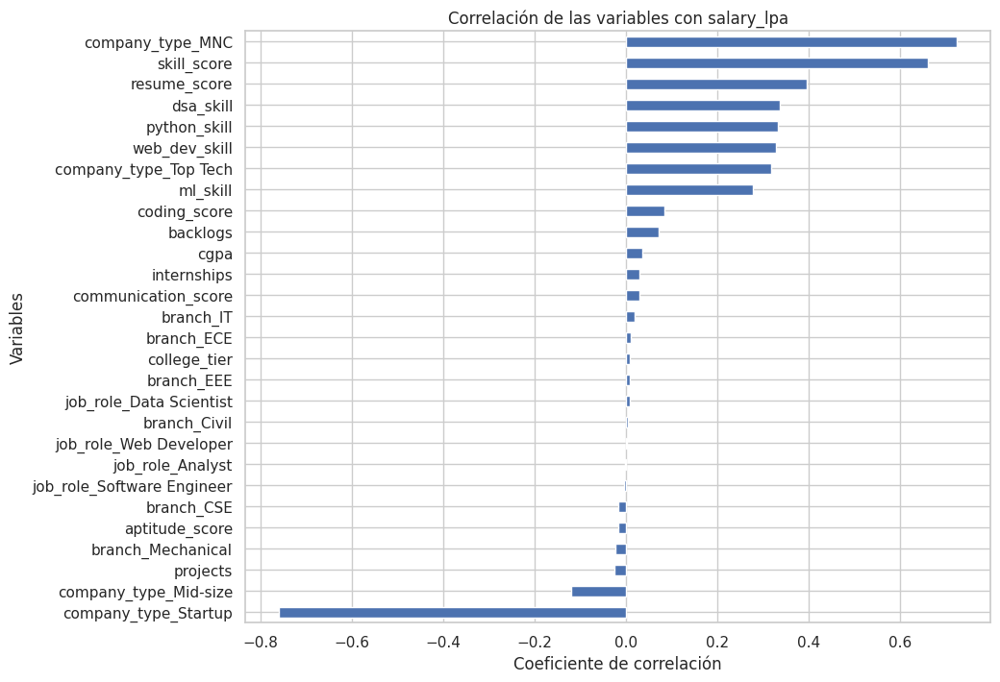

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Leer archivo
df = pd.read_csv("student_salary.csv")

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)

# Separar variables independientes y variable objetivo
X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]

# Columnas categóricas
categorical_features = ["branch", "company_type", "job_role"]

# Rellenar valores nulos en columnas categóricas
for feature in categorical_features:
    X[feature] = X[feature].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=categorical_features, dtype=int)

# Crear dataframe para correlación antes del split
df_corr = X.copy()
df_corr["salary_lpa"] = y

# Calcular matriz de correlación
matriz_corr = df_corr.corr()

# Obtener solo la correlación de salary_lpa con las demás variables
corr_salary = matriz_corr["salary_lpa"].drop("salary_lpa").sort_values(ascending=False)

# Graficar correlación con salary_lpa
plt.figure(figsize=(10, 8))
corr_salary.sort_values().plot(kind="barh")

plt.title("Correlación de las variables con salary_lpa")
plt.xlabel("Coeficiente de correlación")
plt.ylabel("Variables")
plt.show()



# 4. Preparación y normalización de datos

In [34]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

# Leer archivo
df = pd.read_csv("student_salary.csv")

print(df.columns)

# Eliminar filas con valores vacíos
df = df.dropna()

# Eliminar columnas que no aportan o que no se usarán
df = df.drop("student_id", axis=1)
df = df.drop("placed", axis=1)
df = df.drop("branch", axis=1)
df = df.drop("job_role", axis=1)

# Separar variables independientes y variable objetivo
X = df.drop("salary_lpa", axis=1)
y = df["salary_lpa"]



# Rellenar valores nulos en columnas categóricas

X["company_type"] = X["company_type"].fillna("Unknown")

# Aplicar One Hot Encoding antes de la correlación
X = pd.get_dummies(X, columns=["company_type"], dtype=int)

# Separamos en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
)

# Columnas numéricas que sí existen en el dataset
numerical_features = ["cgpa", "coding_score", "communication_score","aptitude_score","projects", "resume_score","skill_score"]

# Escalamiento
sc = StandardScaler()

X_train[numerical_features] = sc.fit_transform(X_train[numerical_features])
X_test[numerical_features] = sc.transform(X_test[numerical_features])



Index(['student_id', 'cgpa', 'branch', 'college_tier', 'python_skill', 'dsa_skill', 'ml_skill', 'web_dev_skill', 'coding_score', 'communication_score', 'aptitude_score', 'internships', 'projects', 'backlogs', 'resume_score', 'skill_score', 'placed', 'company_type', 'job_role', 'salary_lpa'], dtype='object')


In [35]:
# Convertir los datos escalados a DataFrame
X_train_processed = pd.DataFrame(
    X_train,
    columns=X_train.columns,
    index=X_train.index
)

X_test_processed = pd.DataFrame(
    X_test,
    columns=X_test.columns,
    index=X_test.index
)

# Agregar nuevamente la variable objetivo salary_lpa
train_processed = X_train_processed.copy()
train_processed["salary_lpa"] = y_train

test_processed = X_test_processed.copy()
test_processed["salary_lpa"] = y_test

# Guardar como CSV
train_processed.to_csv("train_procesado.csv", index=False)
test_processed.to_csv("test_procesado.csv", index=False)

print("Archivos generados correctamente:")
print("train_procesado.csv")
print("test_procesado.csv")




profile = ProfileReport(train_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()

profile = ProfileReport(test_processed, title="Reporte de análisis exploratorio despues de normalización", explorative=True)

profile.to_notebook_iframe()



Archivos generados correctamente:
train_procesado.csv
test_procesado.csv


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 30.12it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 19/19 [00:00<00:00, 54.26it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [36]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression

modelo = LinearRegression()
modelo.fit(X_train, y_train)
print("R2 en entrenamiento:", modelo.score(X_train, y_train))
print("R2 en prueba:", modelo.score(X_test, y_test))

predicciones = modelo.predict(X_test)

mse = mean_squared_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)
mae = mean_absolute_error(y_test, predicciones)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Error Absoluto medio (MAE): {mae}")
print(f"Coeficiente de Determinación (R2): {r2}")


LinearRegression()

R2 en entrenamiento: 0.8501494720864471
R2 en prueba: 0.8567422351799691
Error Cuadrático Medio (MSE): 42.9991515309077
Error Absoluto medio (MAE): 5.460411136613878
Coeficiente de Determinación (R2): 0.8567422351799691


In [37]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import StandardScaler


# Crear modelo de red neuronal para regresión
modelo = Sequential([
    Dense(32, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(1)  # una sola salida porque queremos predecir salario
])

# Compilar modelo
modelo.compile(
    optimizer='adam',
    loss='mse',
    metrics=['mae']
)

# Entrenar con épocas
history = modelo.fit(
    X_train,
    y_train,
    epochs=120,
    batch_size=10,
    validation_data=(X_test, y_test)
)

# Predicciones
predicciones = modelo.predict(X_test).flatten()

# Métricas
mse = mean_squared_error(y_test, predicciones)
mae = mean_absolute_error(y_test, predicciones)
r2 = r2_score(y_test, predicciones)

print(f"Error Cuadrático Medio (MSE): {mse}")
print(f"Error Absoluto Medio (MAE): {mae}")
print(f"Coeficiente de Determinación (R2): {r2}")


Epoch 1/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 1954.0774 - mae: 37.3622 - val_loss: 278.7244 - val_mae: 13.1008
Epoch 2/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 207.3399 - mae: 11.3446 - val_loss: 157.2938 - val_mae: 9.7446
Epoch 3/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - loss: 125.2732 - mae: 8.7588 - val_loss: 101.9363 - val_mae: 7.8053
Epoch 4/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - loss: 85.3803 - mae: 7.2093 - val_loss: 73.0543 - val_mae: 6.5905
Epoch 5/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 65.0466 - mae: 6.3491 - val_loss: 58.9653 - val_mae: 6.0409
Epoch 6/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - loss: 55.5776 - mae: 5.9572 - val_loss: 53.0100 - val_mae: 5.8499
Epoch 7/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 51.2533 - mae: 5.7863 - val_loss: 49.7677 - val_mae: 5.7334
Epoch 8/120
617/617 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 48.8652 - mae: 5.7061 - val_loss: 47.5380 - val_mae: 5.6536
Epoch 9/120
617/617 ━━

In [38]:
from tensorflow.keras.callbacks import ModelCheckpoint

# Crear carpeta en Google Drive
!mkdir -p "/content/drive/MyDrive/salary_checkpoints"

# Ruta para guardar solo los mejores pesos del modelo
current_directory = "/content/drive/MyDrive"
checkpoint_path = current_directory + "/salary_checkpoints/best_salary_model.weights.h5"

best_checkpoint = ModelCheckpoint(
    filepath=checkpoint_path,
    save_weights_only=True,
    save_freq="epoch",
    monitor="val_mae",
    save_best_only=True,
    mode="min",
    verbose=1
)

history = modelo.fit(
    X_train,
    y_train,
    epochs=120,
    batch_size=20,
    validation_data=(X_test, y_test),
    callbacks=[best_checkpoint]
)

modelo.compile(
    optimizer="adam",
    loss="mse",
    metrics=["mae"]

)


Epoch 1/120
300/309 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 41.5700 - mae: 5.3027
Epoch 1: val_mae improved from None to 5.45164, saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5

Epoch 1: finished saving model to /content/drive/MyDrive/salary_checkpoints/best_salary_model.weights.h5
309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 41.7296 - mae: 5.3333 - val_loss: 43.4257 - val_mae: 5.4516
Epoch 2/120
303/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.1580 - mae: 5.3689
Epoch 2: val_mae did not improve from 5.45164
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 41.6457 - mae: 5.3326 - val_loss: 43.3402 - val_mae: 5.4551
Epoch 3/120
279/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.3870 - mae: 5.3658
Epoch 3: val_mae did not improve from 5.45164
309/309 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - loss: 41.6910 - mae: 5.3352 - val_loss: 43.5242 - val_mae: 5.4536
Epoch 4/120
285/309 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - loss: 42.2004 - mae: 5.3884
Epoch 4:

In [39]:
import pandas as pd

predicciones = modelo.predict(X_test).flatten()

tabla_resultados = pd.DataFrame({
    "Valor real": y_test.values,
    "Valor predicho": predicciones,
    "Error absoluto": abs(y_test.values - predicciones)
})

tabla_resultados = tabla_resultados.round(2)

tabla_resultados.head(20)

49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step


,Valor real,Valor predicho,Error absoluto
0,61.46,65.389999,3.93
1,63.13,66.120003,2.99
2,81.20,78.330002,2.87
3,50.85,47.490002,3.36
4,74.76,64.220001,10.54
5,39.83,45.189999,5.36
6,39.87,44.209999,4.34
7,47.73,44.240002,3.49
8,40.01,42.380001,2.37
9,41.32,46.630001,5.31


<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Comparación entre valores reales y valores predichos')

Text(0.5, 0, 'Muestras')

Text(0, 0.5, 'Salario LPA')

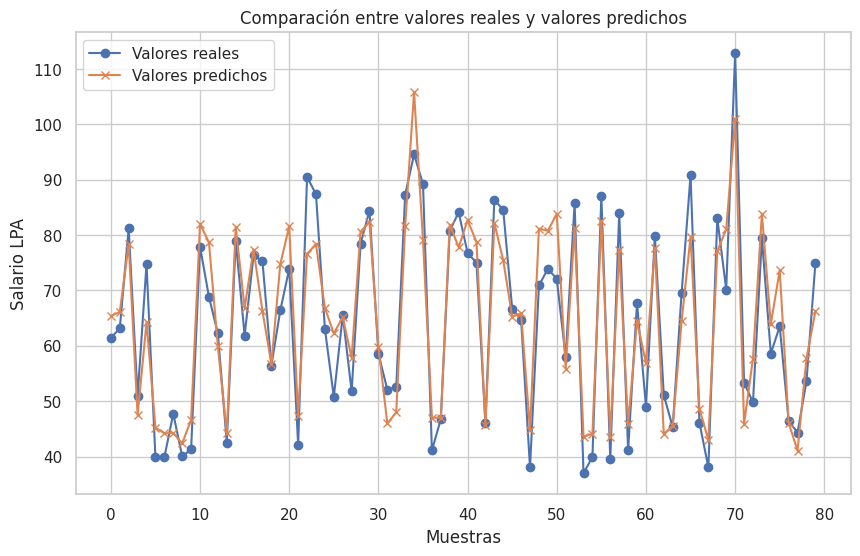

In [40]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))

plt.plot(y_test.values[:80], marker='o', label="Valores reales")
plt.plot(predicciones[:80], marker='x', label="Valores predichos")

plt.title("Comparación entre valores reales y valores predichos")
plt.xlabel("Muestras")
plt.ylabel("Salario LPA")
plt.legend()
plt.grid(True)
plt.show()

<Figure size 1000x600 with 0 Axes>

Text(0.5, 1.0, 'Evolución del MAE durante el entrenamiento')

Text(0.5, 0, 'Épocas')

Text(0, 0.5, 'MAE')

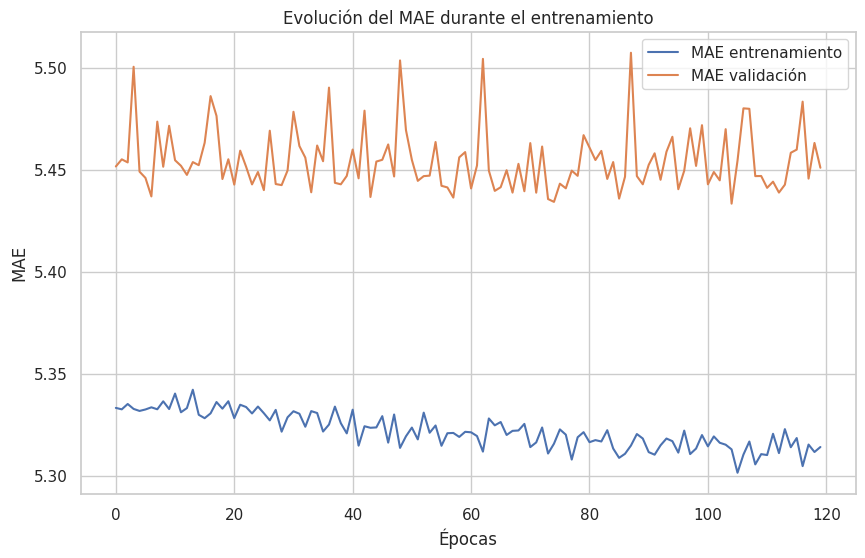

In [41]:
plt.figure(figsize=(10, 6))

plt.plot(history.history["mae"], label="MAE entrenamiento")
plt.plot(history.history["val_mae"], label="MAE validación")

plt.title("Evolución del MAE durante el entrenamiento")
plt.xlabel("Épocas")
plt.ylabel("MAE")
plt.legend()
plt.grid(True)
plt.show()

49/49 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


<Figure size 800x600 with 0 Axes>

Text(0.5, 1.0, 'Valores reales vs predichos')

Text(0.5, 0, 'Valor real')

Text(0, 0.5, 'Valor predicho')

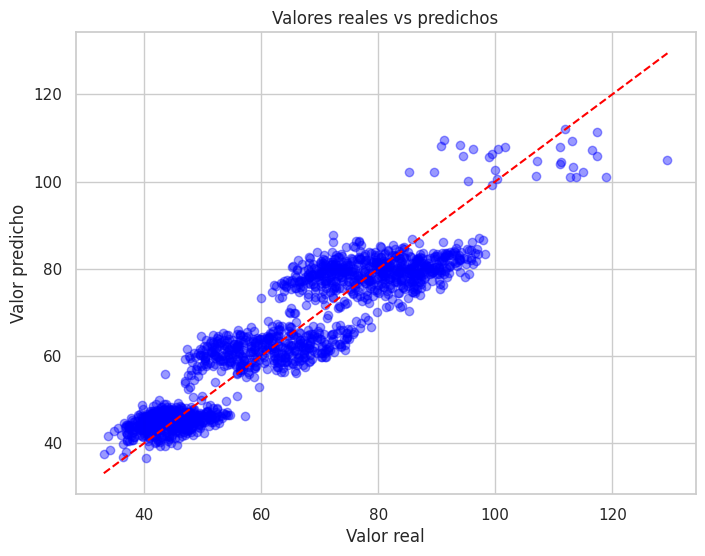

In [42]:
import matplotlib.pyplot as plt

# Generar predicciones
predicciones = modelo.predict(X_test).flatten()

plt.figure(figsize=(8, 6))

# Puntos: valor real vs valor predicho
plt.scatter(
    y_test,
    predicciones,
    color="blue",
    alpha=0.4
)

# Línea diagonal ideal
plt.plot(
    [y_test.min(), y_test.max()],
    [y_test.min(), y_test.max()],
    color="red",
    linestyle="--"
)

plt.title("Valores reales vs predichos")
plt.xlabel("Valor real")
plt.ylabel("Valor predicho")
plt.show()